<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/pix2pix_(P2P_t1_from_t1c).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T1c_mri', 'MR_T1_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    inp, ground_truth = raw_record[modalities[0]], raw_record[modalities[1]]
    inp = process_batch(inp)
    ground_truth = process_batch(ground_truth)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[2]])
        return inp, ground_truth, segmentation
    return inp, ground_truth

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    if len(args) == 4:      # crop also the segmentation, if is given as additional argument
        image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
        return image0, image1, image2, image3
    return image0, image1, image2

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

## Evaluate GAN

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    #for raw_record in dataset.take(10):
    for idx, raw_record in dataset.enumerate():
        inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
        # generate the prediction        
        prediction = model(inp, training=False)
        # crop the images
        inp_cr, ground_truth_cr, prediction_cr, segmentation_cr = resize_with_crop(inp, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth_cr, prediction_cr, segmentation_cr)
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83) and evaluate_tumor_area:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr, ground_truth_masked, prediction_masked)
        elif idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr)
        
        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(prediction_cr)
        ground_truth_normalized_cr = mean_normalize(ground_truth_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 8 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            disc_real_output = discriminator([inp, ground_truth], training=False)
            disc_generated_output = discriminator([inp, prediction], training=False)
            gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, ground_truth)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
        #idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [12]:
"""s = 3
container_gen = tf.TensorArray(tf.float32, size=s)
container_disc = tf.TensorArray(tf.float32, size=s)
idx = 0

generator = Generator()
discriminator = Discriminator()

for raw_record in testing.take(s):
    input_image, target = take_images_from_raw(raw_record)

    prediction = generator(input_image, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([input_image, target], training=True)
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([input_image, prediction], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    container_gen = container_gen.write(idx, gen_total_loss)
    container_disc = container_disc.write(idx, disc_loss)

    idx += 1
container_gen = container_gen.stack()
container_disc = container_disc.stack()

mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
print("GEN loss: {} ± {}".format((f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
print("DISC loss: {} ± {}".format((f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))

plot_loss(mean_gen, mean_disc)
"""

's = 3\ncontainer_gen = tf.TensorArray(tf.float32, size=s)\ncontainer_disc = tf.TensorArray(tf.float32, size=s)\nidx = 0\n\ngenerator = Generator()\ndiscriminator = Discriminator()\n\nfor raw_record in testing.take(s):\n    input_image, target = take_images_from_raw(raw_record)\n\n    prediction = generator(input_image, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([input_image, target], training=True)\n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([input_image, prediction], training=True)\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    container_gen = container_gen.write(idx, gen_total_loss)\n    container_disc = container_disc.write(idx, disc_loss)\n\n    idx += 1\ncontainer_gen = container_gen.stack()\ncontainer_disc = container_disc.stack()\n

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    #ax1.set_ylim([0, 14])
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]       # args[0] 

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    #ax1.set_ylim([10, 36])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    #ax2.set_ylim([0.0, 0.18])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    #ax3.set_ylim([0.0,1.0])
    l3 = ax3.legend(loc="best")


In [15]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.
"""
def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()
    """

"\ndef plot_images(*args, images_to_print=5): \n    if images_to_print == 5: x = 15\n    elif images_to_print == 32: x = 90\n    if len(args) == 3:\n        display_list = [args[0], args[1], args[2]]     # input, gt and prediction\n        title = ['Input Image', 'Ground Truth', 'Predicted Image']\n        figsize = (x , 9)\n    elif len(args) == 2:\n        display_list = [args[0], args[1]]     # input and gt\n        title = ['GT in tumor area', 'Pred in tumor area']\n        figsize = (x , 7)\n    elif len(args) == 4:\n        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked\n        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']\n        figsize = (x , 12)\n    elif len(args) == 5:\n        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked\n        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tum

In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['Input Image', 'Ground Truth', 'Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 1)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    #print(l1_loss.numpy(), l1_loss.numpy()*LAMBDA)
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)


    return total_gen_loss, gan_loss, l1_loss

In [0]:
generator = Generator()

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) #(bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
discriminator = Discriminator()

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [37]:
"""for raw_record in testing.take(1):
    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)
    # generate the prediction            
    prediction = generator(t1, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([t1, t2], training=True)
    
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([t1, prediction], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)
    
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())"""


'for raw_record in testing.take(1):\n    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)\n    # generate the prediction            \n    prediction = generator(t1, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([t1, t2], training=True)\n    \n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([t1, prediction], training=True)\n\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)\n    \n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())'

In [38]:
"""for raw_record in validation.take(10):
    
    inp, ground_truth = take_images_from_raw(raw_record)
    gen_output = generator(inp, training=False)

    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)
    print(mean.numpy())  

    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))

    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output
    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image
    print(l2_loss.numpy())
    print()"""

"for raw_record in validation.take(10):\n    \n    inp, ground_truth = take_images_from_raw(raw_record)\n    gen_output = generator(inp, training=False)\n\n    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)\n    print(mean.numpy())  \n\n    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))\n\n    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output\n    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image\n    print(l2_loss.numpy())\n    print()"

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [39]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/gen_t1_p2p"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')



"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()
"""

Optimizers and models defined but not initialized? True


'\nidx = 0     # this is the checkpoint that will be restored.\n\nif len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore\n    ckpt.restore(ckpt_manager.checkpoints[idx])\n    print (\'Latest checkpoint restored!!\')\nprint("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))\nprint()\n'

Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN STEP**

In [0]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # G produces fake images of T2
        gen_output = generator(input_image, training=True)

        # showing to D a batch of real images of T2
        # t1 is the input image, t2 is the target (ground_truth)
        disc_real_output = discriminator([input_image, target], training=True)
        
        # showing to D a batch fake images of T2
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return loss, style_loss, content_loss, tot_loss
    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)

    for epoch in range(epochs):
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################
            #ckpt_save_path = ckpt_manager.save()
        start = time.time()
        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(32):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            input_image, target = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(input_image, target)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        # saving (checkpoint) the model every 8 epochs
        if (epoch + 1) % 5 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

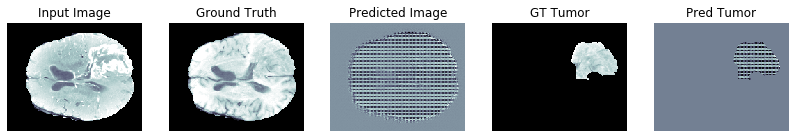

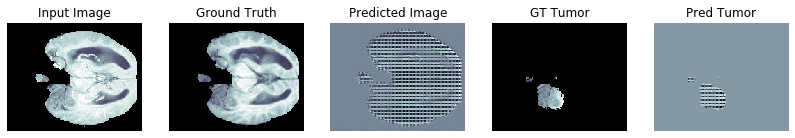

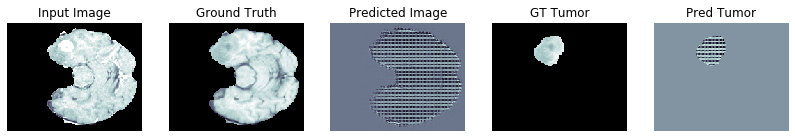

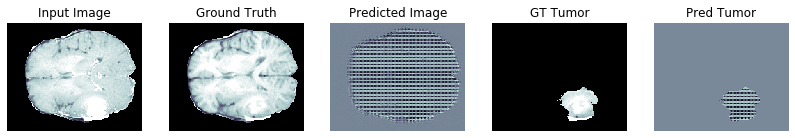

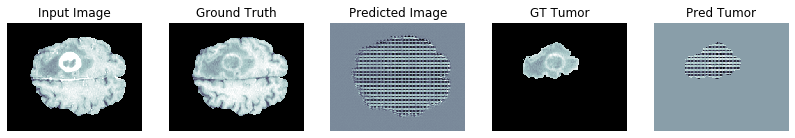

PSNR on validation set: 8.6238 ± 3.4046
MSE on validation set: 0.1618 ± 0.0638
SSIM on validation set: -0.0328 ± 0.1155

PSNR wrt tumor area on validation set: 16.9177 ± 8.4983
MSE wrt tumor area on validation set: 0.0379 ± 0.0301
SSIM wrt tumor area on validation set: 0.1679 ± 0.3655

Generator loss on validation set: 13.4018 ± 5.8309
Discriminator loss on validation set: 1.3888 ± 0.0012

Epoch:  1
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.........................................................................

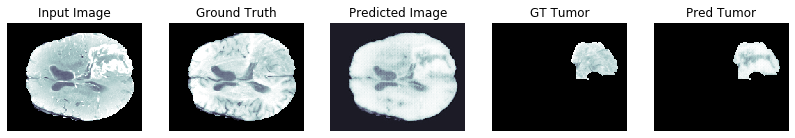

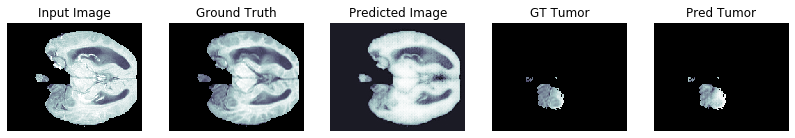

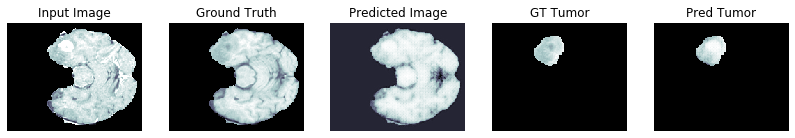

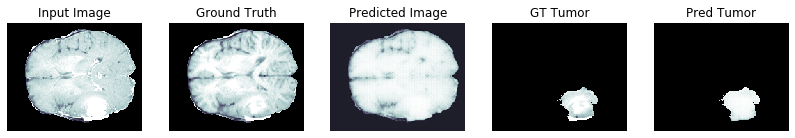

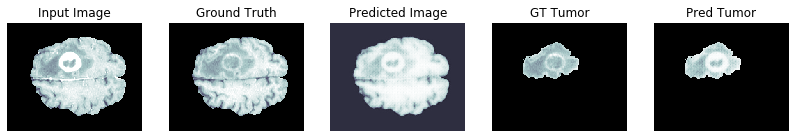

PSNR on validation set: 22.9717 ± 3.3345
MSE on validation set: 0.0064 ± 0.0044
SSIM on validation set: 0.7999 ± 0.0865

PSNR wrt tumor area on validation set: 35.0786 ± 10.1267
MSE wrt tumor area on validation set: 0.0009 ± 0.0009
SSIM wrt tumor area on validation set: 0.9759 ± 0.0233

Generator loss on validation set: 2.6226 ± 0.7376
Discriminator loss on validation set: 1.5260 ± 0.0548

Time taken for epoch 1 is 420.9397757053375 sec


Epoch:  2
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

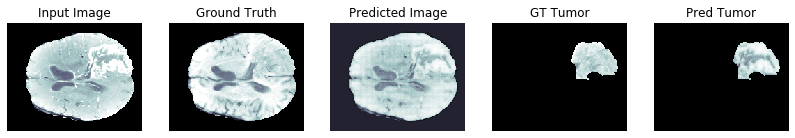

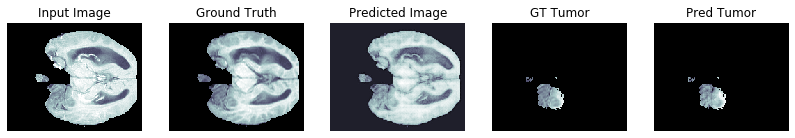

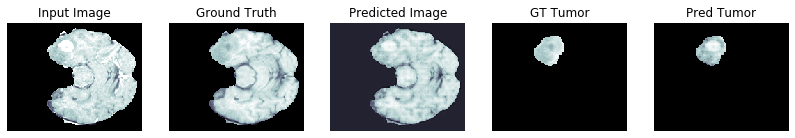

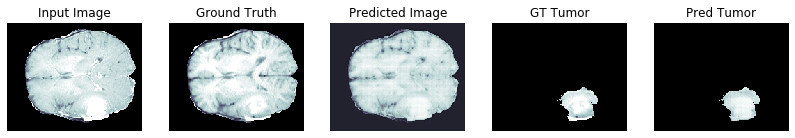

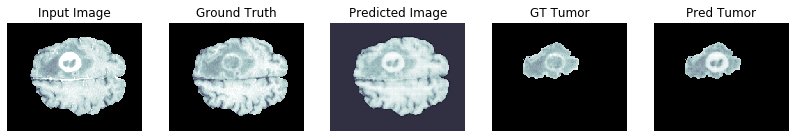

PSNR on validation set: 22.0349 ± 3.4756
MSE on validation set: 0.0078 ± 0.0046
SSIM on validation set: 0.8082 ± 0.0858

PSNR wrt tumor area on validation set: 35.7107 ± 11.2509
MSE wrt tumor area on validation set: 0.0008 ± 0.0009
SSIM wrt tumor area on validation set: 0.9769 ± 0.0227

Generator loss on validation set: 2.4790 ± 1.0652
Discriminator loss on validation set: 1.6539 ± 0.0370

Time taken for epoch 2 is 414.19688296318054 sec


Epoch:  3
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

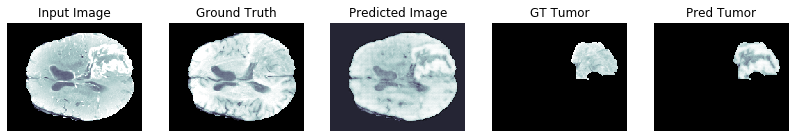

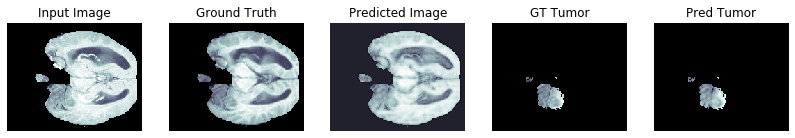

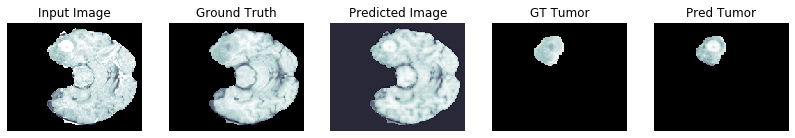

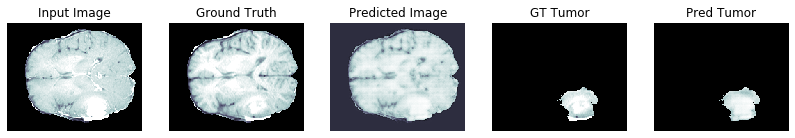

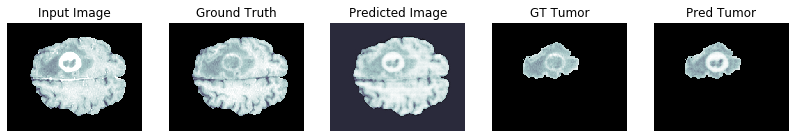

PSNR on validation set: 22.1579 ± 3.7466
MSE on validation set: 0.0078 ± 0.0047
SSIM on validation set: 0.8159 ± 0.0862

PSNR wrt tumor area on validation set: 35.7415 ± 11.4813
MSE wrt tumor area on validation set: 0.0008 ± 0.0009
SSIM wrt tumor area on validation set: 0.9773 ± 0.0222

Generator loss on validation set: 2.8779 ± 0.8226
Discriminator loss on validation set: 1.6420 ± 0.0566

Time taken for epoch 3 is 414.3793635368347 sec


Epoch:  4
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

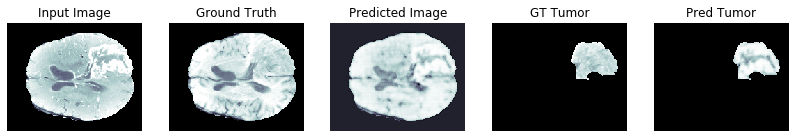

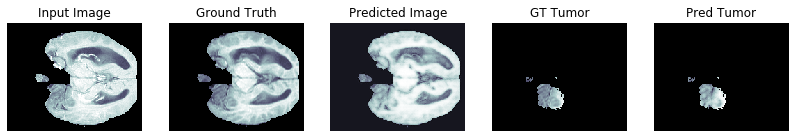

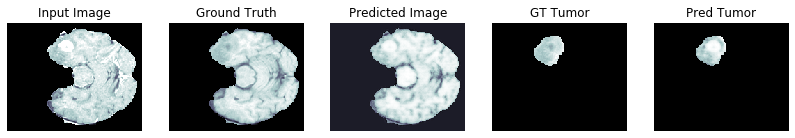

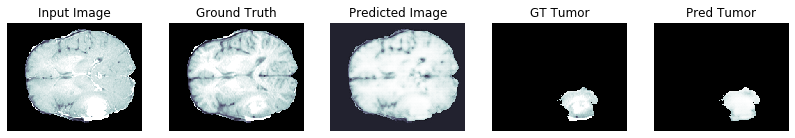

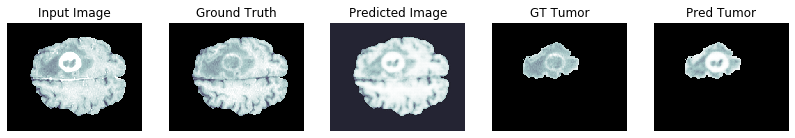

PSNR on validation set: 23.8183 ± 3.6567
MSE on validation set: 0.0055 ± 0.0040
SSIM on validation set: 0.8315 ± 0.0827

PSNR wrt tumor area on validation set: 35.6977 ± 12.1711
MSE wrt tumor area on validation set: 0.0008 ± 0.0008
SSIM wrt tumor area on validation set: 0.9775 ± 0.0209

Generator loss on validation set: 2.1749 ± 0.7686
Discriminator loss on validation set: 1.7173 ± 0.0872

Time taken for epoch 4 is 413.72619128227234 sec


Epoch:  5
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

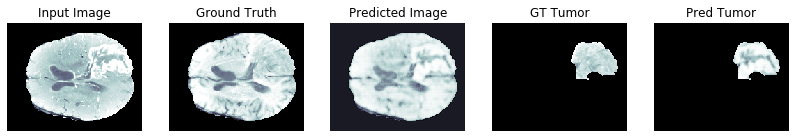

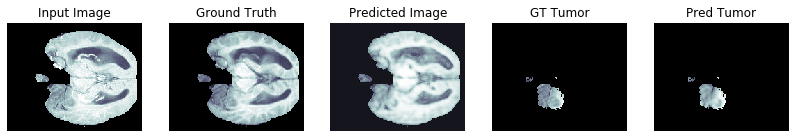

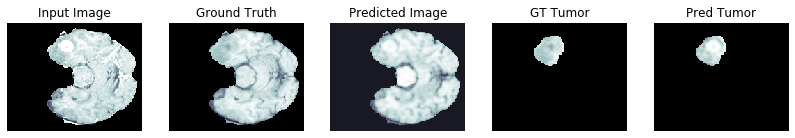

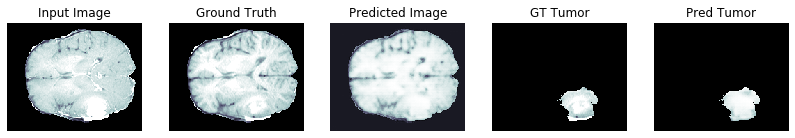

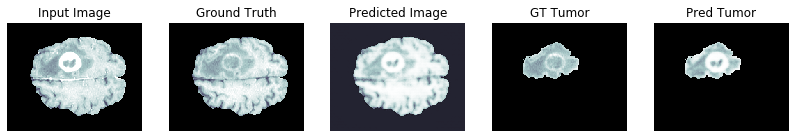

PSNR on validation set: 23.9612 ± 3.4098
MSE on validation set: 0.0050 ± 0.0031
SSIM on validation set: 0.8323 ± 0.0793

PSNR wrt tumor area on validation set: 35.7694 ± 11.7324
MSE wrt tumor area on validation set: 0.0008 ± 0.0008
SSIM wrt tumor area on validation set: 0.9780 ± 0.0203

Generator loss on validation set: 1.8045 ± 0.6314
Discriminator loss on validation set: 1.5880 ± 0.0351

Saving checkpoint for epoch 5 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-1
Time taken for epoch 5 is 417.50583958625793 sec


Epoch:  6
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
...............................................

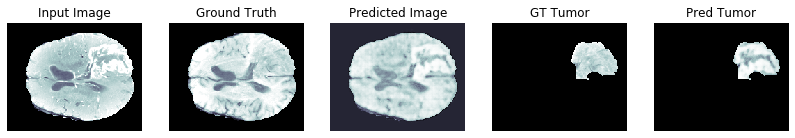

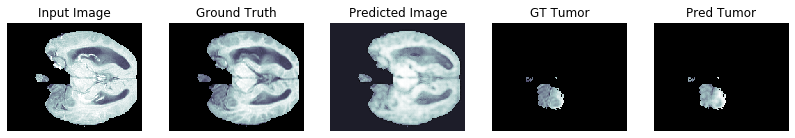

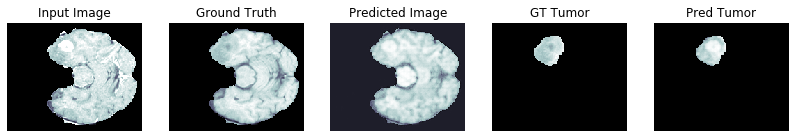

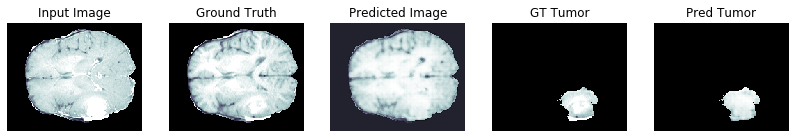

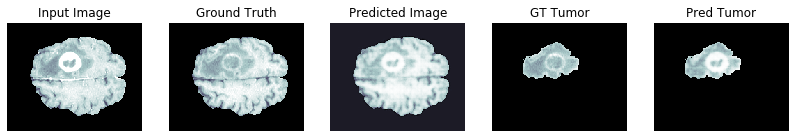

PSNR on validation set: 22.8111 ± 3.5812
MSE on validation set: 0.0066 ± 0.0038
SSIM on validation set: 0.8188 ± 0.0857

PSNR wrt tumor area on validation set: 35.7900 ± 10.0791
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9777 ± 0.0208

Generator loss on validation set: 2.1485 ± 0.6860
Discriminator loss on validation set: 1.4145 ± 0.0407

Time taken for epoch 6 is 414.53875494003296 sec


Epoch:  7
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

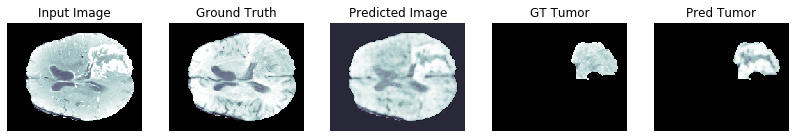

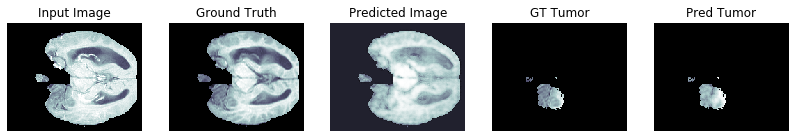

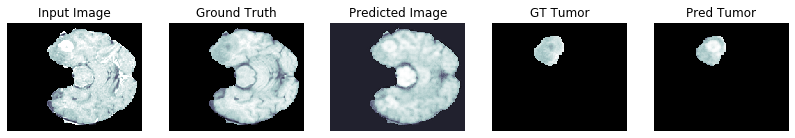

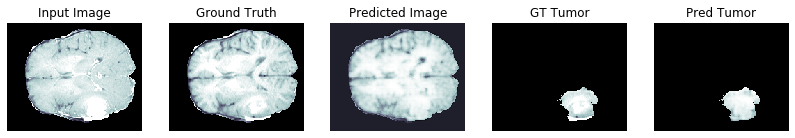

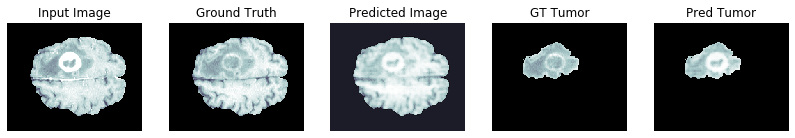

PSNR on validation set: 22.7477 ± 3.6016
MSE on validation set: 0.0067 ± 0.0039
SSIM on validation set: 0.8156 ± 0.0872

PSNR wrt tumor area on validation set: 35.9345 ± 10.2571
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9776 ± 0.0208

Generator loss on validation set: 2.0854 ± 0.6607
Discriminator loss on validation set: 1.4020 ± 0.0162

Time taken for epoch 7 is 414.0220146179199 sec


Epoch:  8
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

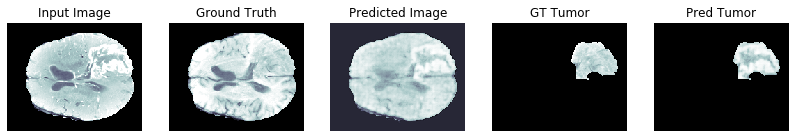

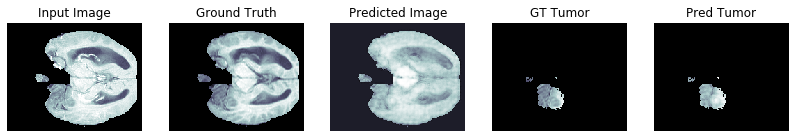

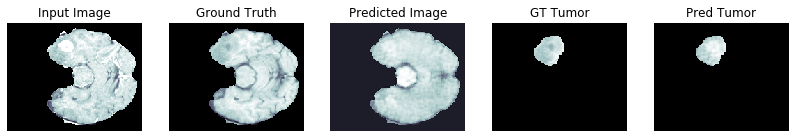

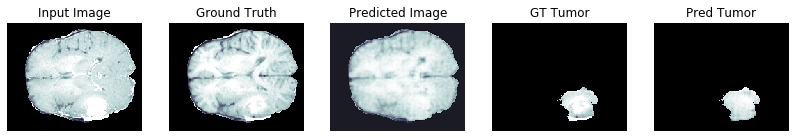

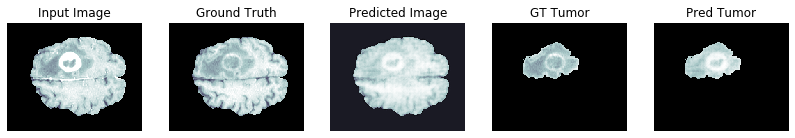

PSNR on validation set: 22.6797 ± 3.5299
MSE on validation set: 0.0067 ± 0.0038
SSIM on validation set: 0.7987 ± 0.0985

PSNR wrt tumor area on validation set: 35.9422 ± 9.3338
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9769 ± 0.0213

Generator loss on validation set: 2.2432 ± 0.6847
Discriminator loss on validation set: 1.4094 ± 0.0128

Time taken for epoch 8 is 413.7158441543579 sec


Epoch:  9
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
........................

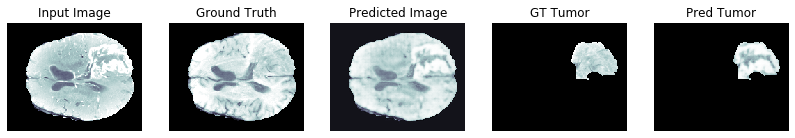

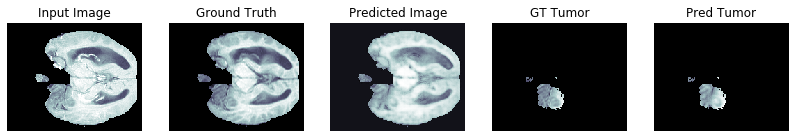

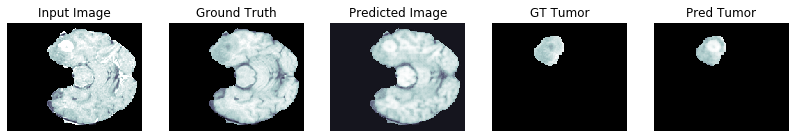

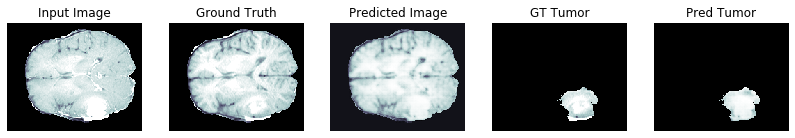

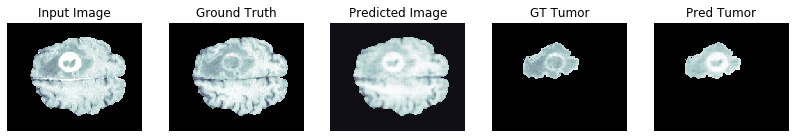

PSNR on validation set: 24.5388 ± 3.5166
MSE on validation set: 0.0045 ± 0.0029
SSIM on validation set: 0.8385 ± 0.0802

PSNR wrt tumor area on validation set: 36.4209 ± 11.1076
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0198

Generator loss on validation set: 2.0443 ± 0.6601
Discriminator loss on validation set: 1.4287 ± 0.0286

Time taken for epoch 9 is 413.90219736099243 sec


Epoch:  10
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

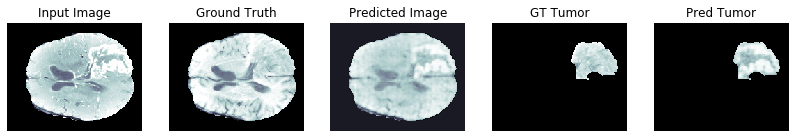

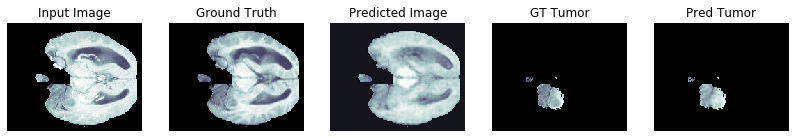

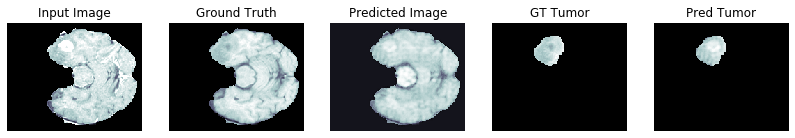

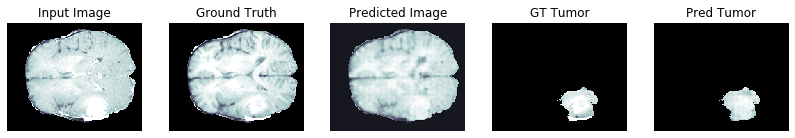

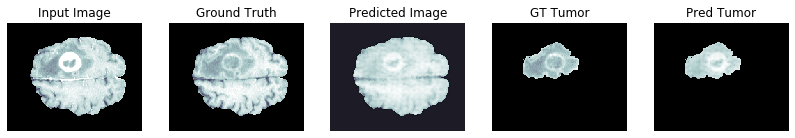

PSNR on validation set: 23.6422 ± 3.5834
MSE on validation set: 0.0055 ± 0.0032
SSIM on validation set: 0.8143 ± 0.0943

PSNR wrt tumor area on validation set: 36.2599 ± 10.0108
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9773 ± 0.0211

Generator loss on validation set: 2.1655 ± 0.6776
Discriminator loss on validation set: 1.3896 ± 0.0084

Saving checkpoint for epoch 10 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-2
Time taken for epoch 10 is 416.7641751766205 sec


Epoch:  11
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.............................................

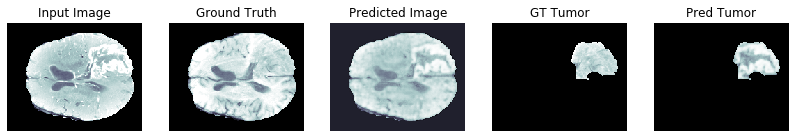

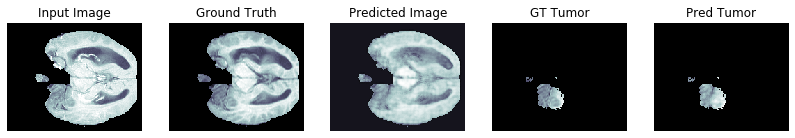

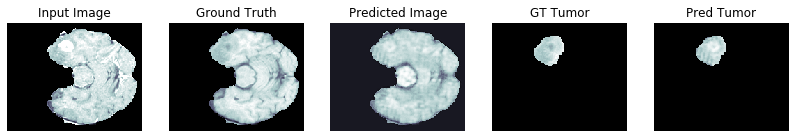

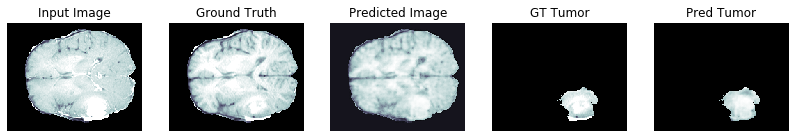

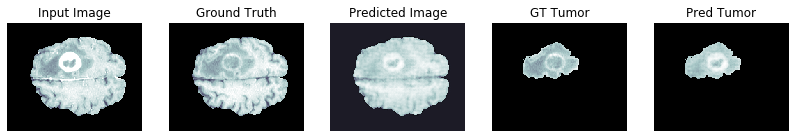

PSNR on validation set: 22.8864 ± 3.6767
MSE on validation set: 0.0065 ± 0.0038
SSIM on validation set: 0.8128 ± 0.0930

PSNR wrt tumor area on validation set: 36.1767 ± 10.4606
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9773 ± 0.0212

Generator loss on validation set: 2.2514 ± 0.7316
Discriminator loss on validation set: 1.4018 ± 0.0177

Time taken for epoch 11 is 413.68861413002014 sec


Epoch:  12
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

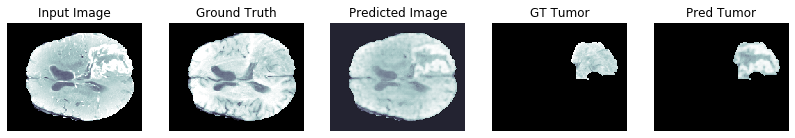

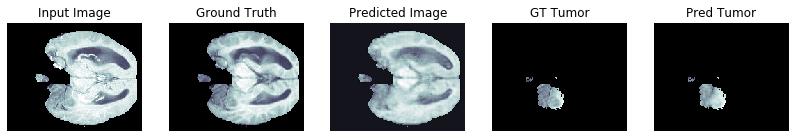

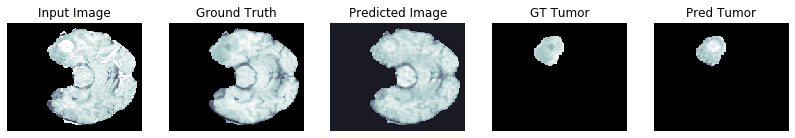

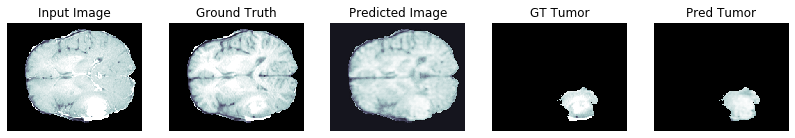

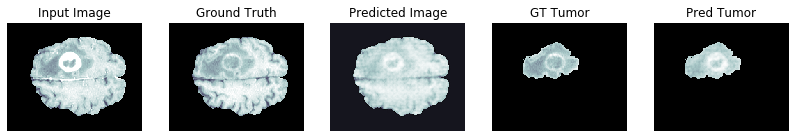

PSNR on validation set: 23.2442 ± 3.5947
MSE on validation set: 0.0060 ± 0.0035
SSIM on validation set: 0.8149 ± 0.0889

PSNR wrt tumor area on validation set: 36.1899 ± 9.1275
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9778 ± 0.0208

Generator loss on validation set: 2.2984 ± 0.7331
Discriminator loss on validation set: 1.3960 ± 0.0087

Time taken for epoch 12 is 414.90830993652344 sec


Epoch:  13
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

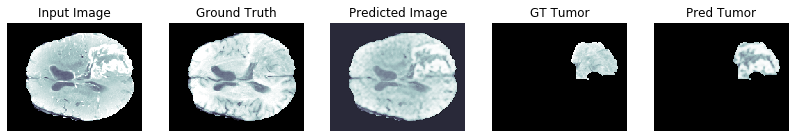

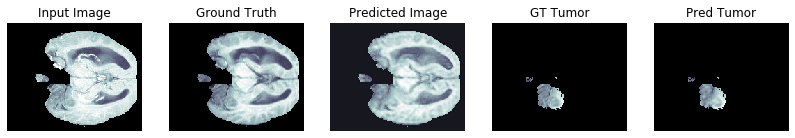

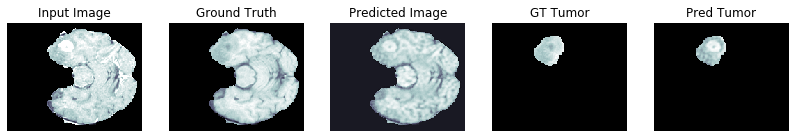

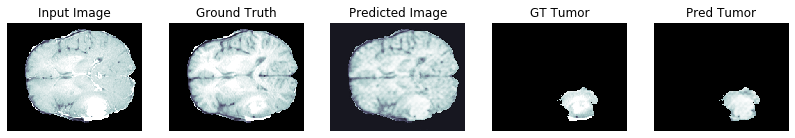

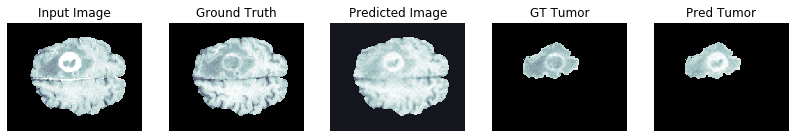

PSNR on validation set: 23.1960 ± 3.5329
MSE on validation set: 0.0060 ± 0.0036
SSIM on validation set: 0.8248 ± 0.0820

PSNR wrt tumor area on validation set: 36.0145 ± 9.7875
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9777 ± 0.0211

Generator loss on validation set: 2.1675 ± 0.7197
Discriminator loss on validation set: 1.4081 ± 0.0146

Time taken for epoch 13 is 415.4762945175171 sec


Epoch:  14
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

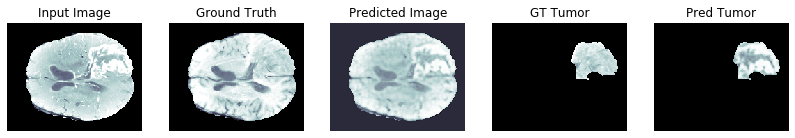

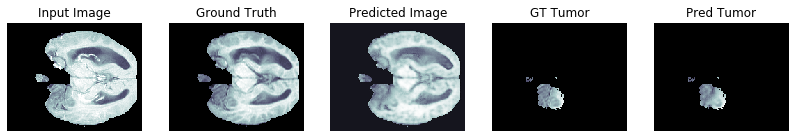

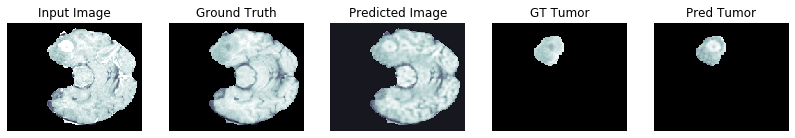

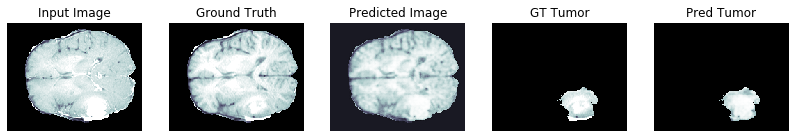

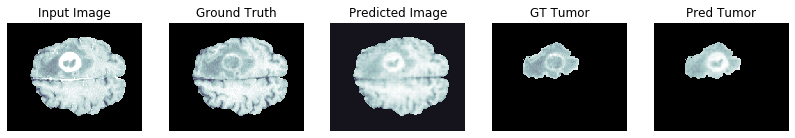

PSNR on validation set: 23.6121 ± 3.5089
MSE on validation set: 0.0055 ± 0.0034
SSIM on validation set: 0.8305 ± 0.0805

PSNR wrt tumor area on validation set: 36.1300 ± 9.0067
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9786 ± 0.0204

Generator loss on validation set: 2.1879 ± 0.6583
Discriminator loss on validation set: 1.4375 ± 0.0170

Time taken for epoch 14 is 415.1466062068939 sec


Epoch:  15
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

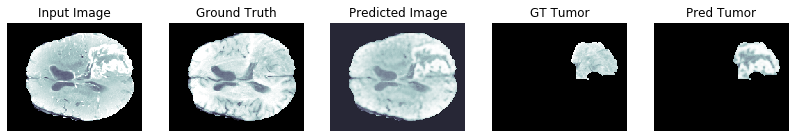

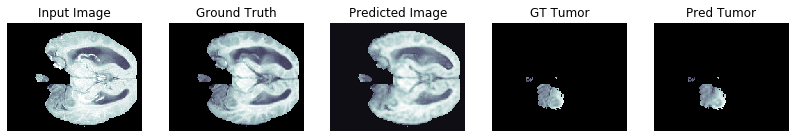

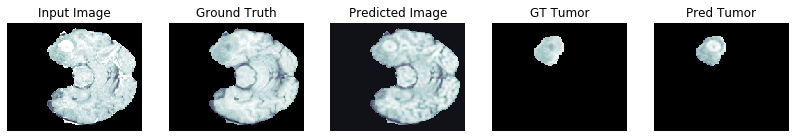

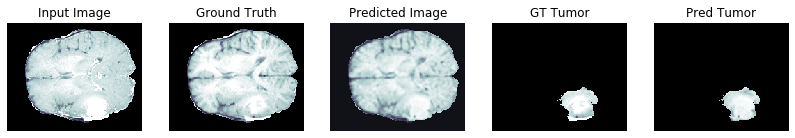

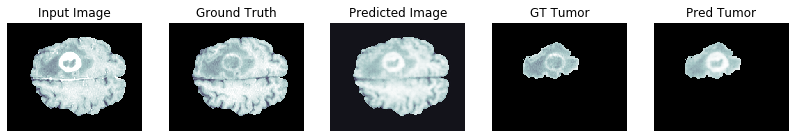

PSNR on validation set: 24.0174 ± 3.5154
MSE on validation set: 0.0050 ± 0.0032
SSIM on validation set: 0.8363 ± 0.0785

PSNR wrt tumor area on validation set: 36.3182 ± 9.8457
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9793 ± 0.0199

Generator loss on validation set: 2.1958 ± 0.6902
Discriminator loss on validation set: 1.4276 ± 0.0327

Saving checkpoint for epoch 15 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-3
Time taken for epoch 15 is 417.32278537750244 sec


Epoch:  16
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.............................................

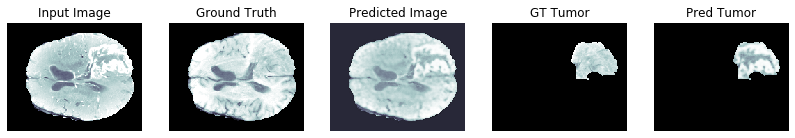

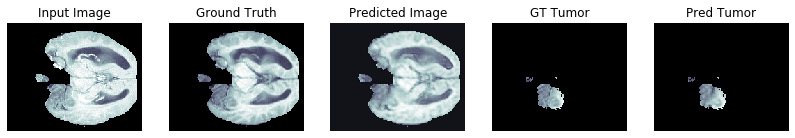

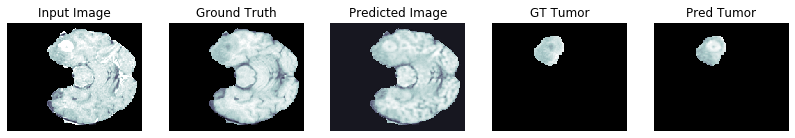

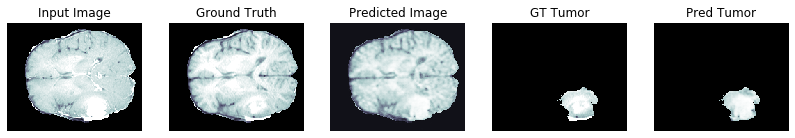

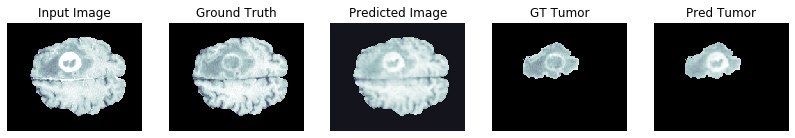

PSNR on validation set: 23.7318 ± 3.5348
MSE on validation set: 0.0054 ± 0.0034
SSIM on validation set: 0.8318 ± 0.0798

PSNR wrt tumor area on validation set: 36.4150 ± 11.1365
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0203

Generator loss on validation set: 2.1425 ± 0.6811
Discriminator loss on validation set: 1.4054 ± 0.0125

Time taken for epoch 16 is 414.9754135608673 sec


Epoch:  17
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

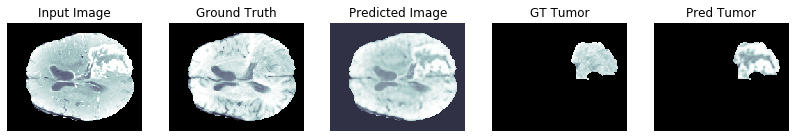

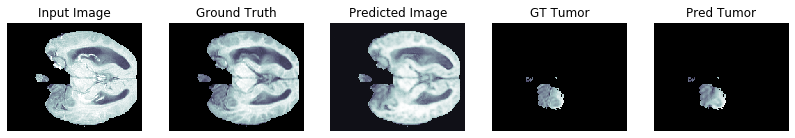

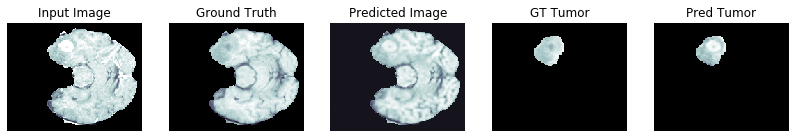

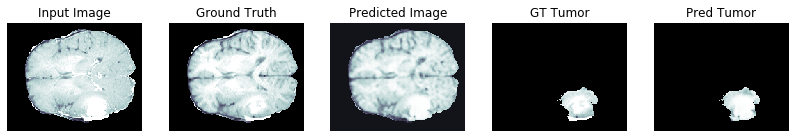

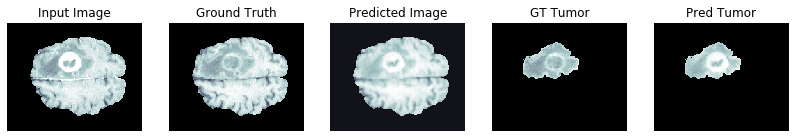

PSNR on validation set: 24.4495 ± 3.5864
MSE on validation set: 0.0046 ± 0.0031
SSIM on validation set: 0.8420 ± 0.0774

PSNR wrt tumor area on validation set: 36.1255 ± 9.2754
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0201

Generator loss on validation set: 2.0172 ± 0.6031
Discriminator loss on validation set: 1.4085 ± 0.0091

Time taken for epoch 17 is 414.31900358200073 sec


Epoch:  18
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

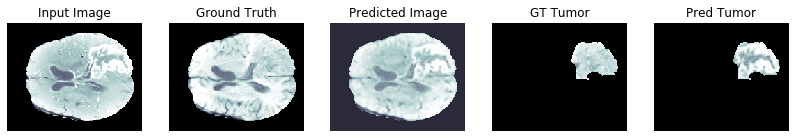

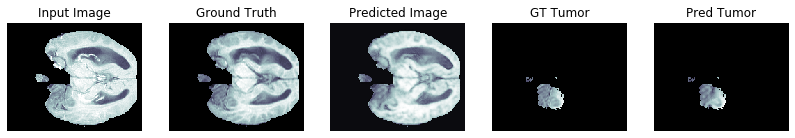

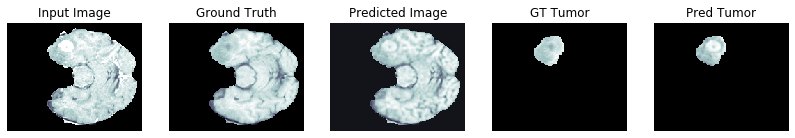

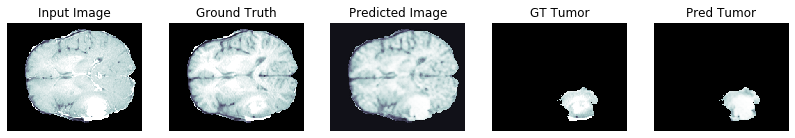

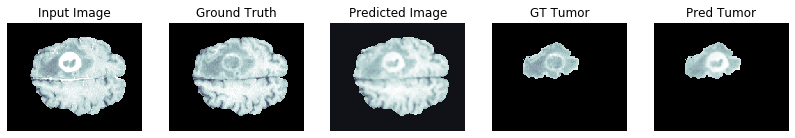

PSNR on validation set: 24.3899 ± 3.5573
MSE on validation set: 0.0046 ± 0.0031
SSIM on validation set: 0.8413 ± 0.0776

PSNR wrt tumor area on validation set: 35.9505 ± 8.5249
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0202

Generator loss on validation set: 2.1755 ± 0.5972
Discriminator loss on validation set: 1.5591 ± 0.0792

Time taken for epoch 18 is 413.81624817848206 sec


Epoch:  19
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

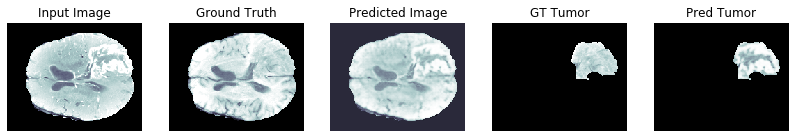

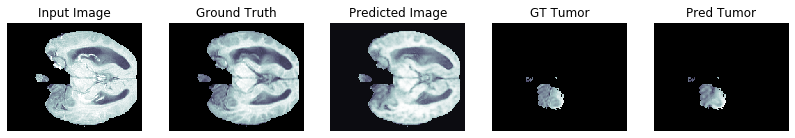

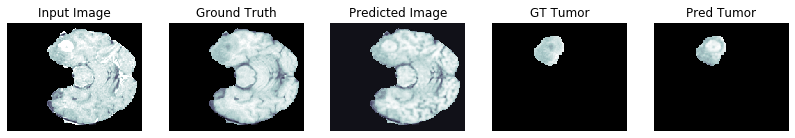

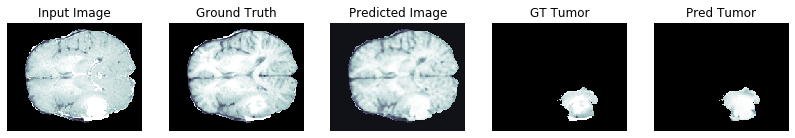

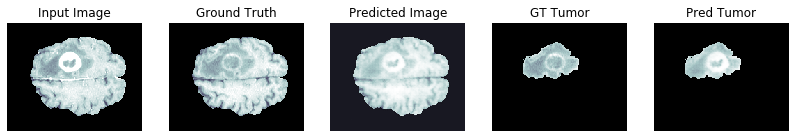

PSNR on validation set: 24.4671 ± 3.4337
MSE on validation set: 0.0045 ± 0.0029
SSIM on validation set: 0.8409 ± 0.0769

PSNR wrt tumor area on validation set: 36.1933 ± 9.8274
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0200

Generator loss on validation set: 2.0032 ± 0.6065
Discriminator loss on validation set: 1.3891 ± 0.0072

Time taken for epoch 19 is 414.1431128978729 sec


Epoch:  20
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

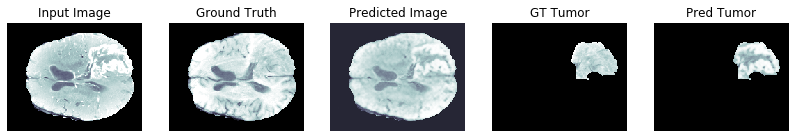

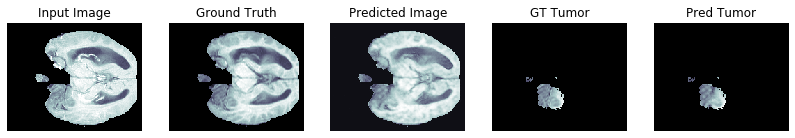

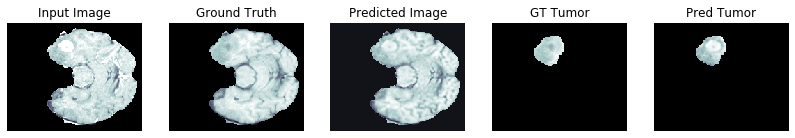

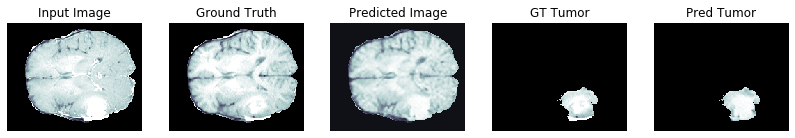

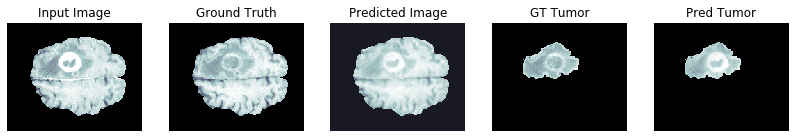

PSNR on validation set: 24.0926 ± 3.5221
MSE on validation set: 0.0049 ± 0.0031
SSIM on validation set: 0.8361 ± 0.0786

PSNR wrt tumor area on validation set: 36.0381 ± 8.2174
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9787 ± 0.0203

Generator loss on validation set: 2.1327 ± 0.6669
Discriminator loss on validation set: 1.3871 ± 0.0082

Saving checkpoint for epoch 20 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-4
Time taken for epoch 20 is 417.3597950935364 sec


Epoch:  21
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
..............................................

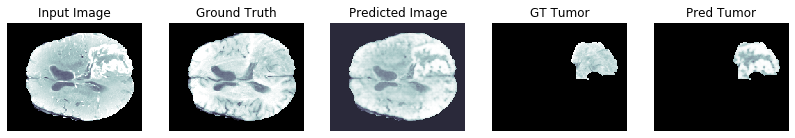

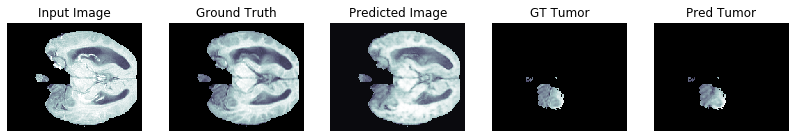

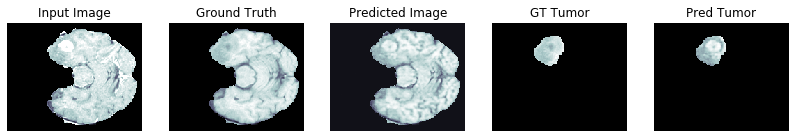

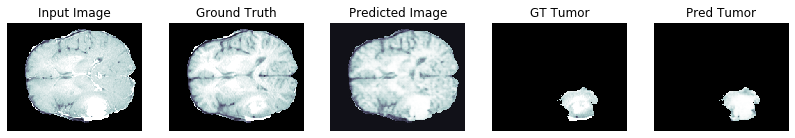

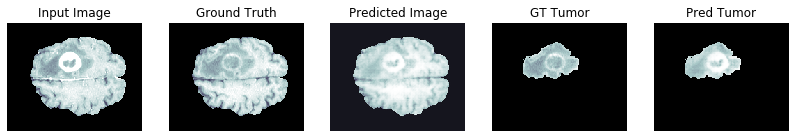

PSNR on validation set: 24.3112 ± 3.4702
MSE on validation set: 0.0047 ± 0.0031
SSIM on validation set: 0.8352 ± 0.0791

PSNR wrt tumor area on validation set: 36.2267 ± 11.2449
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9783 ± 0.0205

Generator loss on validation set: 2.0601 ± 0.6366
Discriminator loss on validation set: 1.3926 ± 0.0056

Time taken for epoch 21 is 414.01634407043457 sec


Epoch:  22
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

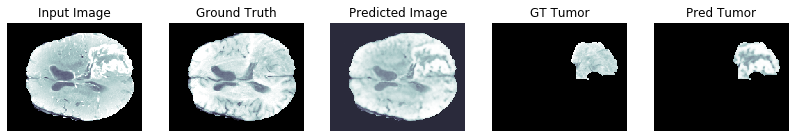

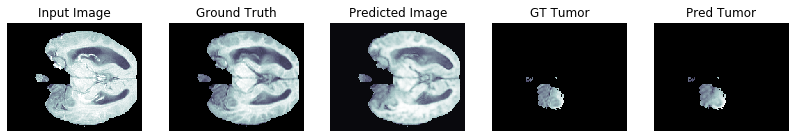

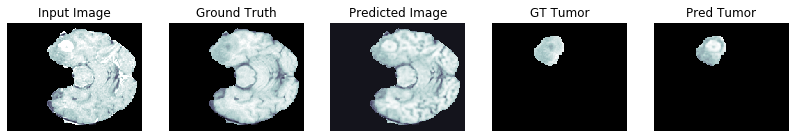

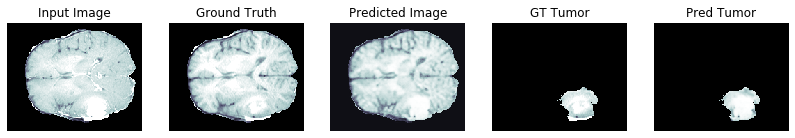

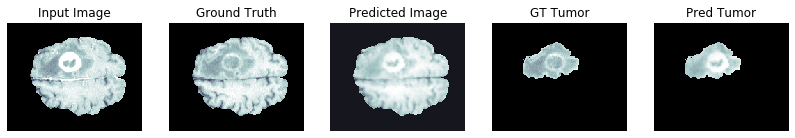

PSNR on validation set: 24.4432 ± 3.5380
MSE on validation set: 0.0046 ± 0.0031
SSIM on validation set: 0.8418 ± 0.0777

PSNR wrt tumor area on validation set: 36.1467 ± 9.4430
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0204

Generator loss on validation set: 1.9656 ± 0.6389
Discriminator loss on validation set: 1.3921 ± 0.0038

Time taken for epoch 22 is 414.0226058959961 sec


Epoch:  23
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

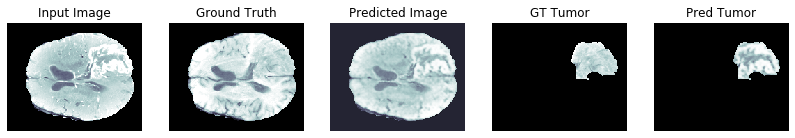

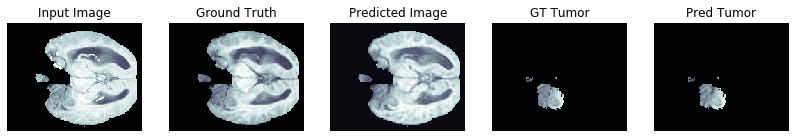

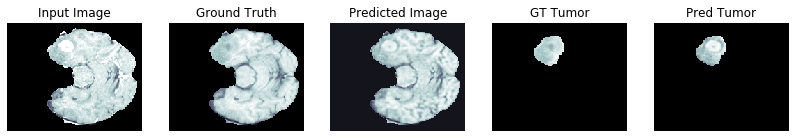

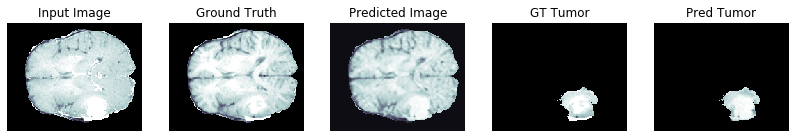

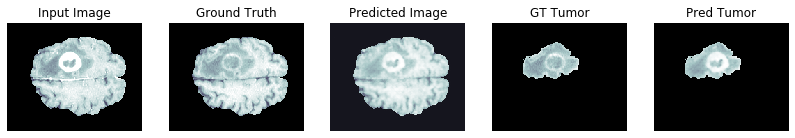

PSNR on validation set: 24.2873 ± 3.5525
MSE on validation set: 0.0048 ± 0.0032
SSIM on validation set: 0.8374 ± 0.0799

PSNR wrt tumor area on validation set: 36.1970 ± 10.4237
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9786 ± 0.0205

Generator loss on validation set: 2.1422 ± 0.6871
Discriminator loss on validation set: 1.3894 ± 0.0032

Time taken for epoch 23 is 414.0597152709961 sec


Epoch:  24
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

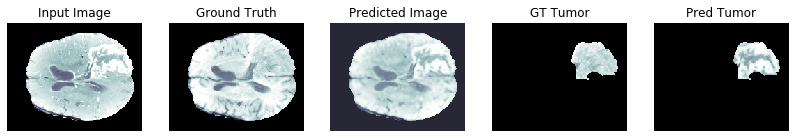

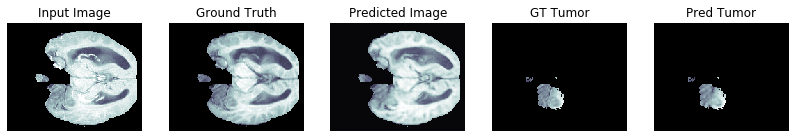

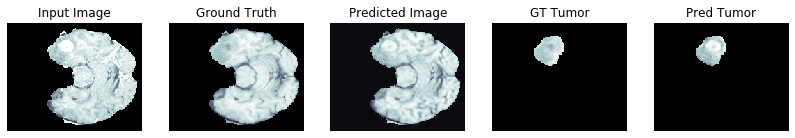

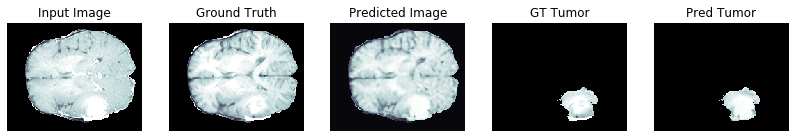

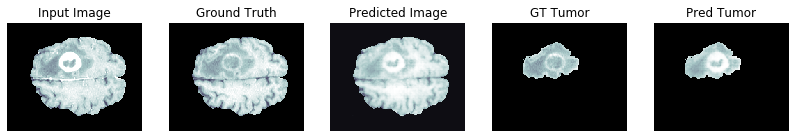

PSNR on validation set: 24.9303 ± 3.5511
MSE on validation set: 0.0041 ± 0.0028
SSIM on validation set: 0.8453 ± 0.0772

PSNR wrt tumor area on validation set: 36.2283 ± 10.3212
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0201

Generator loss on validation set: 2.1888 ± 0.6259
Discriminator loss on validation set: 1.4218 ± 0.0066

Time taken for epoch 24 is 413.8882782459259 sec


Epoch:  25
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

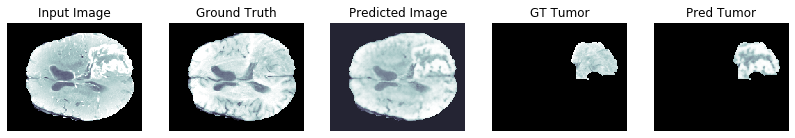

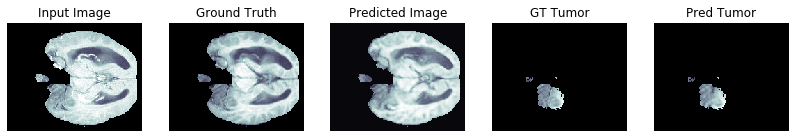

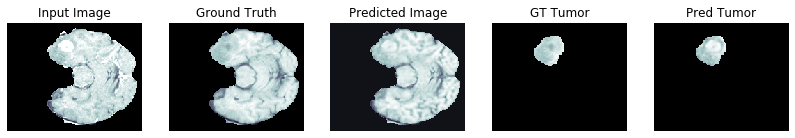

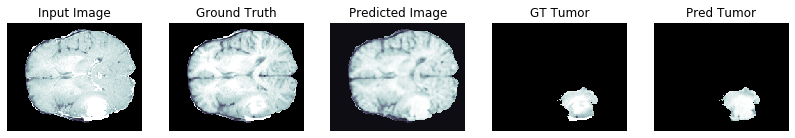

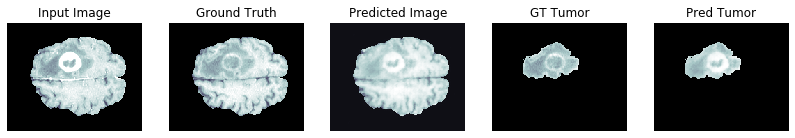

PSNR on validation set: 24.7407 ± 3.5277
MSE on validation set: 0.0043 ± 0.0029
SSIM on validation set: 0.8433 ± 0.0774

PSNR wrt tumor area on validation set: 36.2442 ± 9.8095
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0203

Generator loss on validation set: 2.0438 ± 0.5990
Discriminator loss on validation set: 1.4412 ± 0.0185

Saving checkpoint for epoch 25 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-5
Time taken for epoch 25 is 416.9374511241913 sec


Epoch:  26
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
..............................................

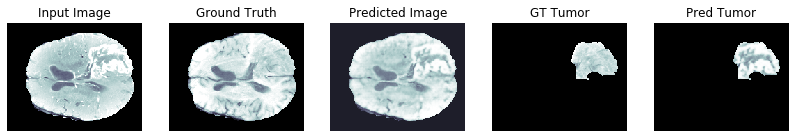

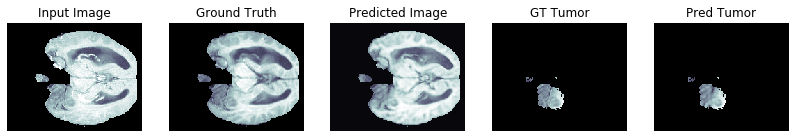

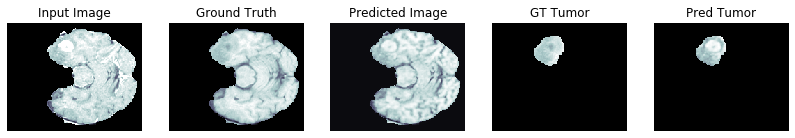

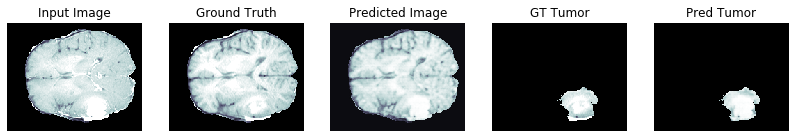

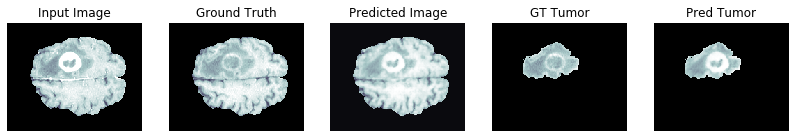

PSNR on validation set: 24.9240 ± 3.6334
MSE on validation set: 0.0042 ± 0.0029
SSIM on validation set: 0.8441 ± 0.0791

PSNR wrt tumor area on validation set: 35.8921 ± 9.3655
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9785 ± 0.0207

Generator loss on validation set: 2.3155 ± 0.6900
Discriminator loss on validation set: 1.5240 ± 0.0491

Time taken for epoch 26 is 413.8932580947876 sec


Epoch:  27
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

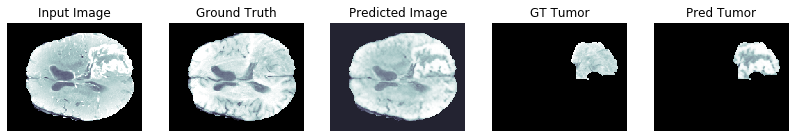

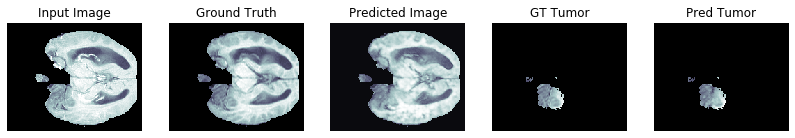

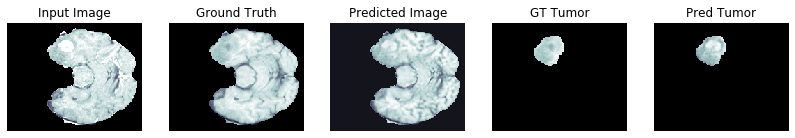

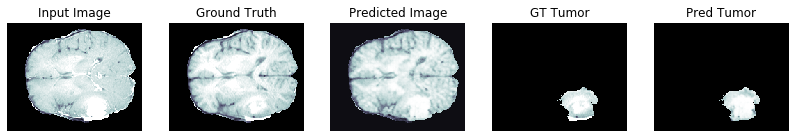

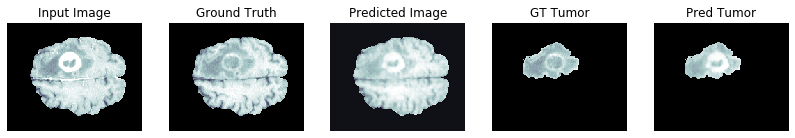

PSNR on validation set: 24.2883 ± 3.5218
MSE on validation set: 0.0047 ± 0.0031
SSIM on validation set: 0.8331 ± 0.0806

PSNR wrt tumor area on validation set: 35.9045 ± 9.5008
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9776 ± 0.0211

Generator loss on validation set: 2.0431 ± 0.6331
Discriminator loss on validation set: 1.4041 ± 0.0106

Time taken for epoch 27 is 414.36633944511414 sec


Epoch:  28
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

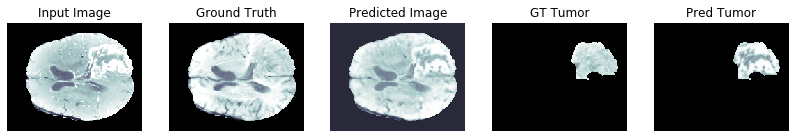

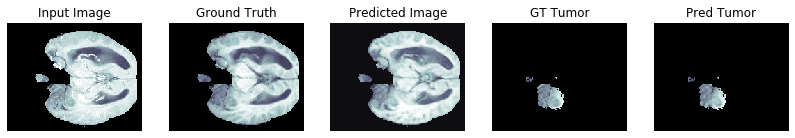

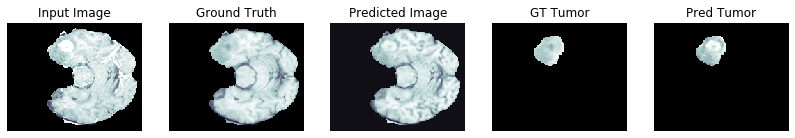

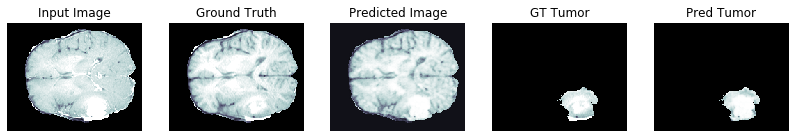

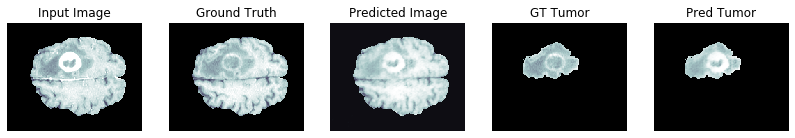

PSNR on validation set: 24.5215 ± 3.5953
MSE on validation set: 0.0046 ± 0.0032
SSIM on validation set: 0.8385 ± 0.0803

PSNR wrt tumor area on validation set: 35.9491 ± 10.2033
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9779 ± 0.0212

Generator loss on validation set: 2.0861 ± 0.6388
Discriminator loss on validation set: 1.3919 ± 0.0071

Time taken for epoch 28 is 414.2971796989441 sec


Epoch:  29
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

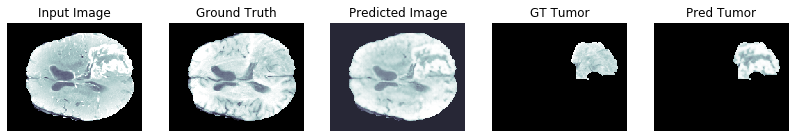

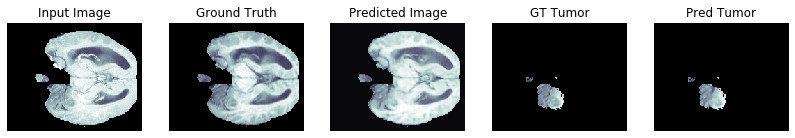

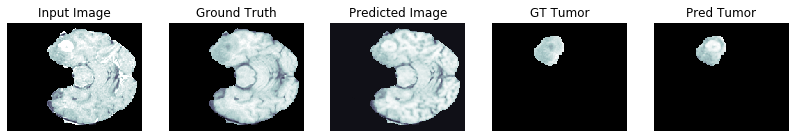

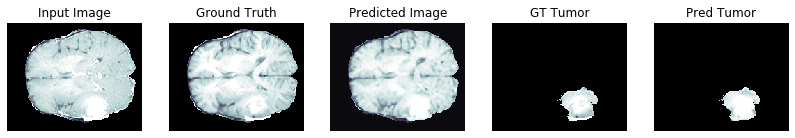

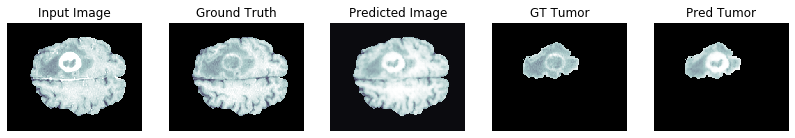

PSNR on validation set: 25.2940 ± 3.5921
MSE on validation set: 0.0038 ± 0.0027
SSIM on validation set: 0.8475 ± 0.0769

PSNR wrt tumor area on validation set: 36.1796 ± 10.1123
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0201

Generator loss on validation set: 2.0185 ± 0.5895
Discriminator loss on validation set: 1.4218 ± 0.0061

Time taken for epoch 29 is 414.6487832069397 sec


Epoch:  30
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

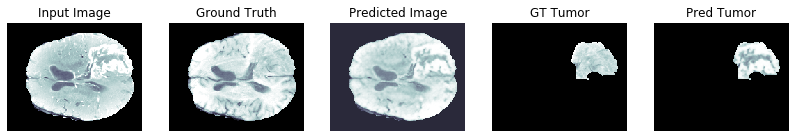

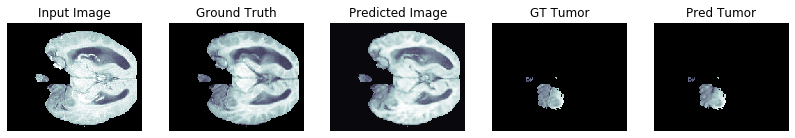

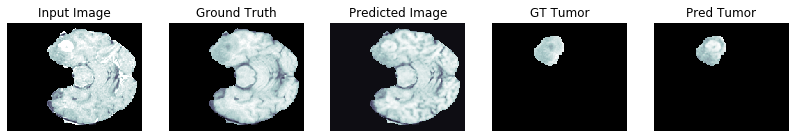

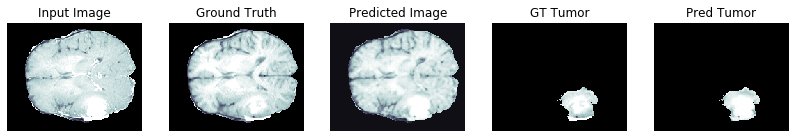

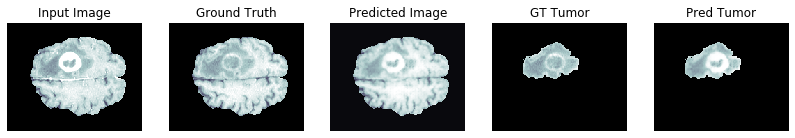

PSNR on validation set: 24.9772 ± 3.6109
MSE on validation set: 0.0041 ± 0.0029
SSIM on validation set: 0.8444 ± 0.0786

PSNR wrt tumor area on validation set: 36.0932 ± 10.0699
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9786 ± 0.0206

Generator loss on validation set: 1.9610 ± 0.6336
Discriminator loss on validation set: 1.3884 ± 0.0045

Saving checkpoint for epoch 30 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-6
Time taken for epoch 30 is 417.4400644302368 sec


Epoch:  31
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.............................................

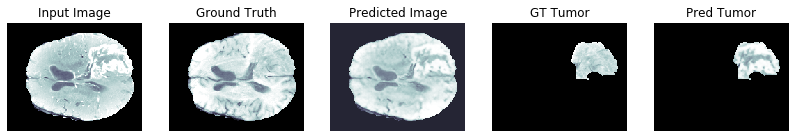

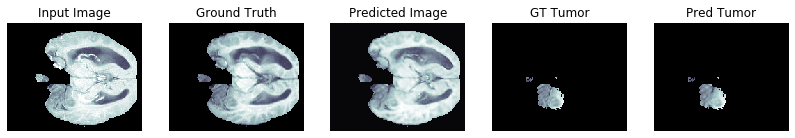

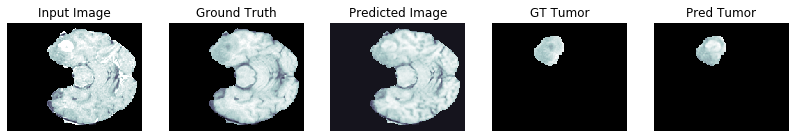

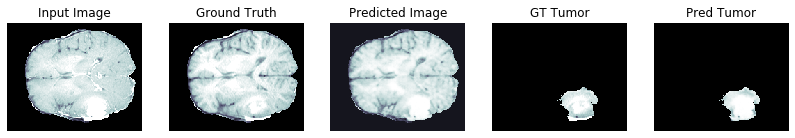

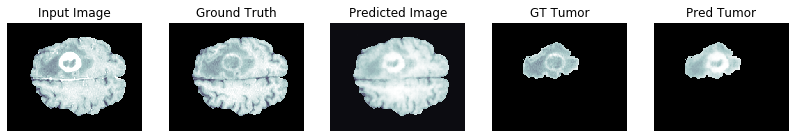

PSNR on validation set: 24.7773 ± 3.5305
MSE on validation set: 0.0043 ± 0.0029
SSIM on validation set: 0.8433 ± 0.0776

PSNR wrt tumor area on validation set: 36.1496 ± 8.5896
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0201

Generator loss on validation set: 1.8306 ± 0.6066
Discriminator loss on validation set: 1.4301 ± 0.0185

Time taken for epoch 31 is 415.0310082435608 sec


Epoch:  32
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

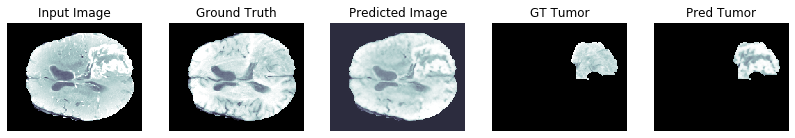

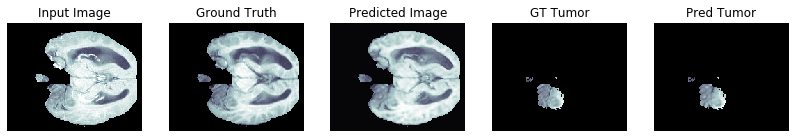

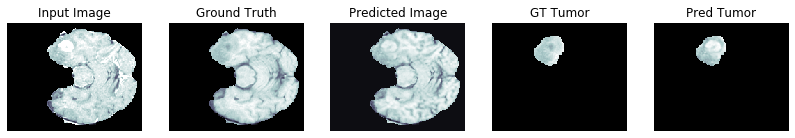

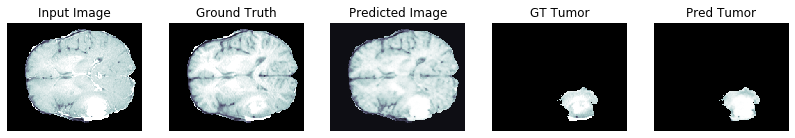

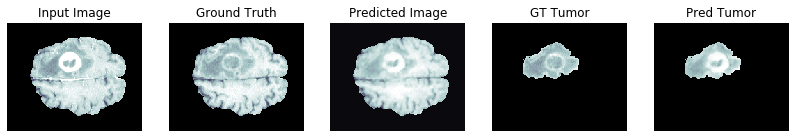

PSNR on validation set: 24.8232 ± 3.5588
MSE on validation set: 0.0042 ± 0.0030
SSIM on validation set: 0.8434 ± 0.0784

PSNR wrt tumor area on validation set: 36.0663 ± 9.2885
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9786 ± 0.0206

Generator loss on validation set: 2.0561 ± 0.6327
Discriminator loss on validation set: 1.3972 ± 0.0048

Time taken for epoch 32 is 414.894770860672 sec


Epoch:  33
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

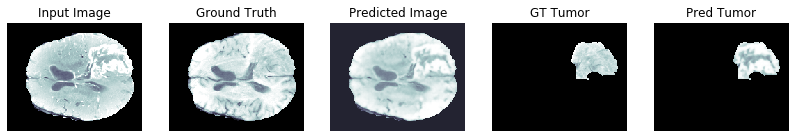

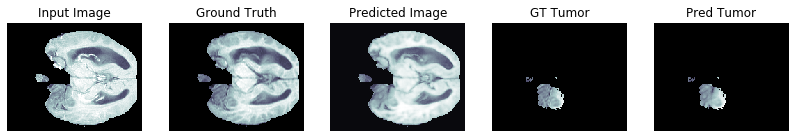

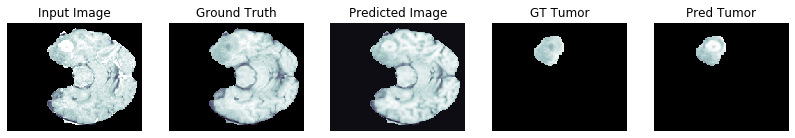

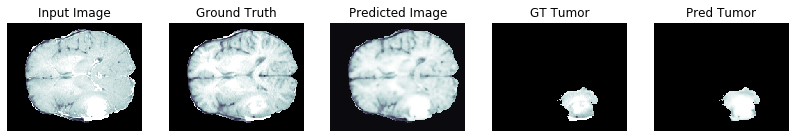

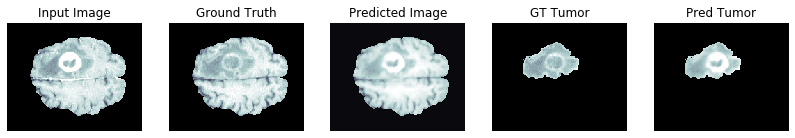

PSNR on validation set: 25.5255 ± 3.7038
MSE on validation set: 0.0036 ± 0.0026
SSIM on validation set: 0.8561 ± 0.0739

PSNR wrt tumor area on validation set: 36.5700 ± 11.5574
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9799 ± 0.0194

Generator loss on validation set: 1.9108 ± 0.5878
Discriminator loss on validation set: 1.4077 ± 0.0093

Time taken for epoch 33 is 414.48984456062317 sec


Epoch:  34
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

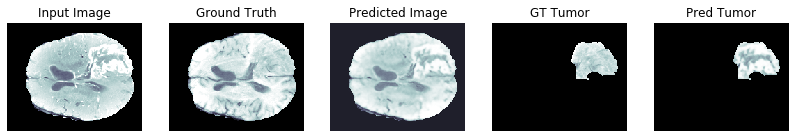

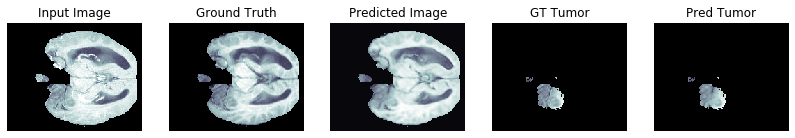

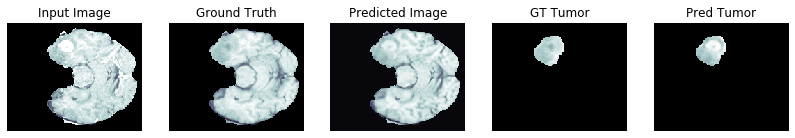

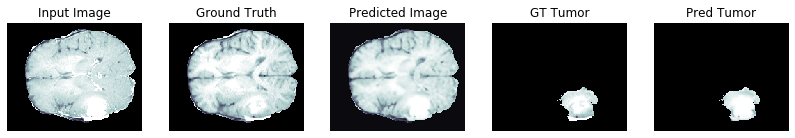

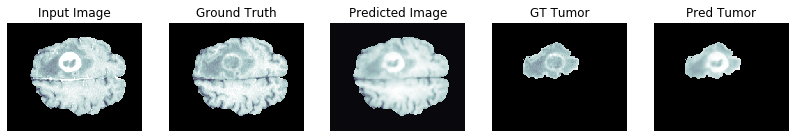

PSNR on validation set: 25.3153 ± 3.6766
MSE on validation set: 0.0038 ± 0.0027
SSIM on validation set: 0.8521 ± 0.0749

PSNR wrt tumor area on validation set: 36.6567 ± 11.7943
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9797 ± 0.0196

Generator loss on validation set: 1.8880 ± 0.6013
Discriminator loss on validation set: 1.4244 ± 0.0210

Time taken for epoch 34 is 414.1245927810669 sec


Epoch:  35
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

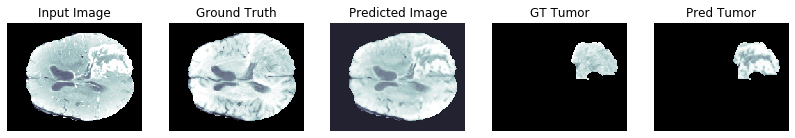

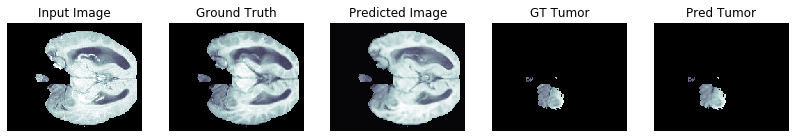

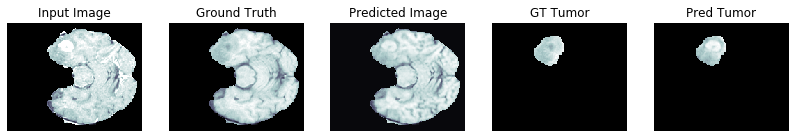

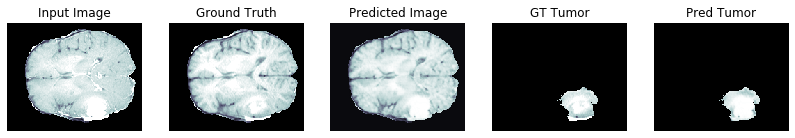

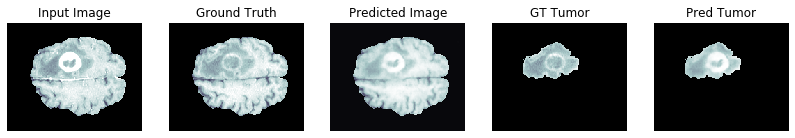

PSNR on validation set: 25.2023 ± 3.6684
MSE on validation set: 0.0039 ± 0.0028
SSIM on validation set: 0.8476 ± 0.0770

PSNR wrt tumor area on validation set: 36.4843 ± 10.6745
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9793 ± 0.0198

Generator loss on validation set: 2.0120 ± 0.6179
Discriminator loss on validation set: 1.3925 ± 0.0076

Saving checkpoint for epoch 35 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-7
Time taken for epoch 35 is 417.7708566188812 sec

Saving FINAL checkpoint for epoch 35 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-8


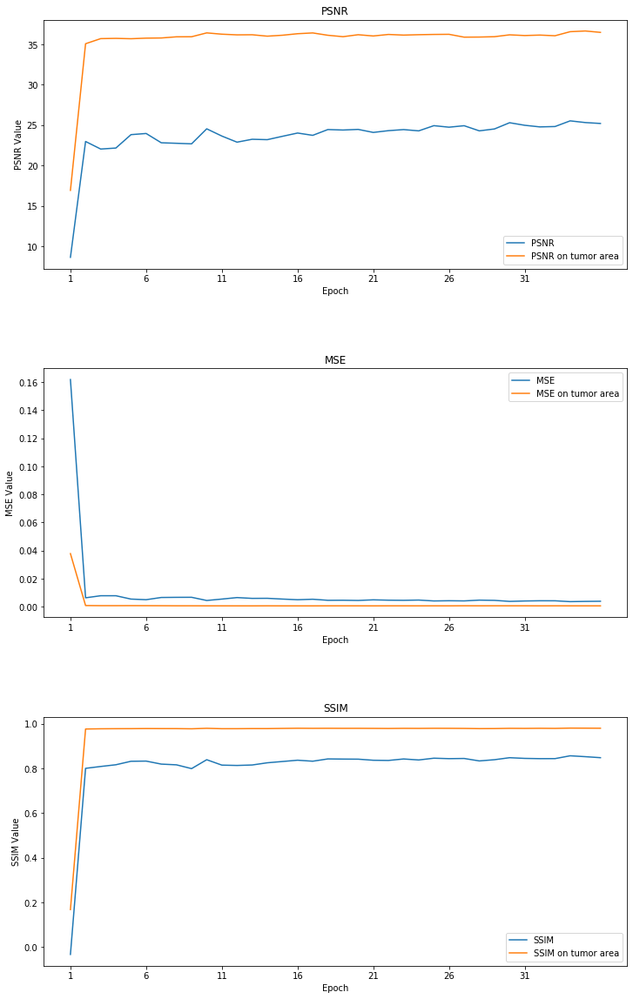

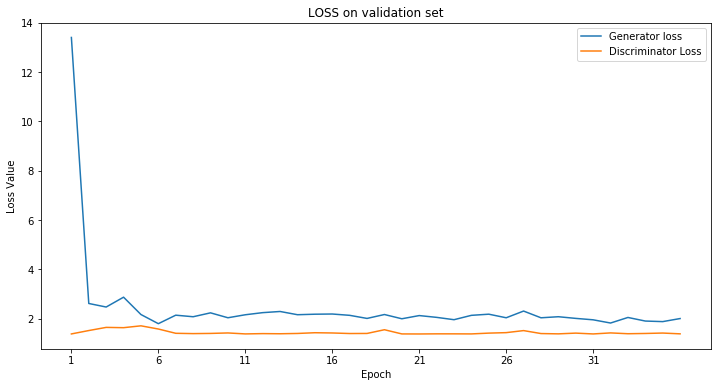

In [43]:
EPOCHS = 35
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = False       # want to save the model at the end of the training ? 
epochs_already_trained = 0      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_T1c_35ep_p2p.h5')

##Evaluating the final model with the test set

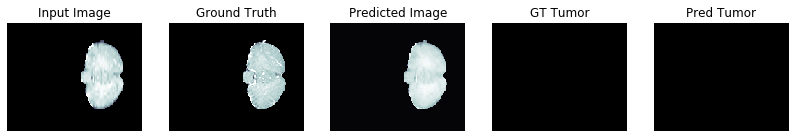

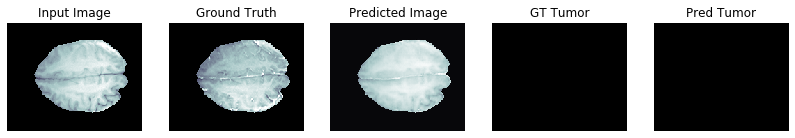

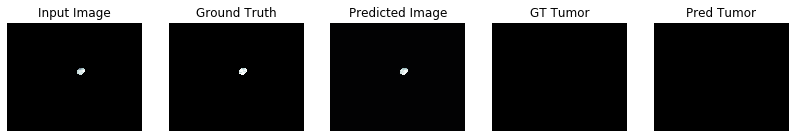

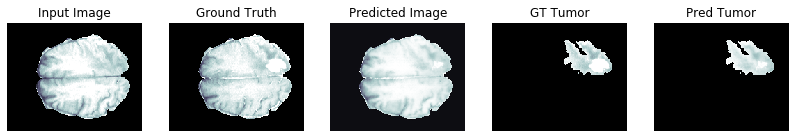

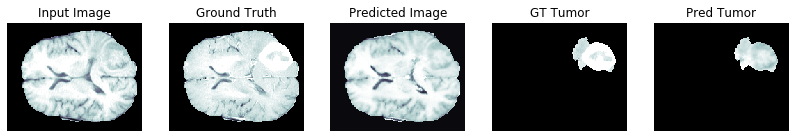

PSNR on test set: 24.6165 ± 4.0755
MSE on test set: 0.0051 ± 0.0048
SSIM on test set: 0.8139 ± 0.0996

PSNR wrt tumor area on test set: 35.8285 ± 14.7486
MSE wrt tumor area on test set: 0.0012 ± 0.0020
SSIM wrt tumor area on test set: 0.9694 ± 0.0383

Generator loss on test set: 2.0334 ± 0.4664
Discriminator loss on test set: 1.6062 ± 0.0288


(<tf.Tensor: shape=(), dtype=float32, numpy=24.616549>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.005066051>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.81387377>,
 <tf.Tensor: shape=(), dtype=float32, numpy=35.828503>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.001248471>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.96943>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.0333664>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.6061859>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

In [0]:
generator.save('drive/My Drive/MRI-generation/pix2pix/gen_T1c_42ep.h5')

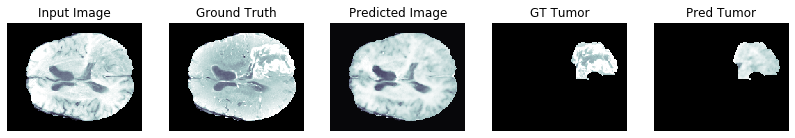

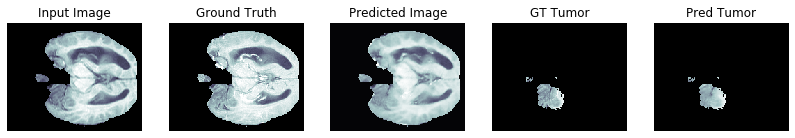

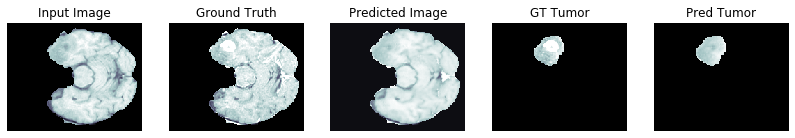

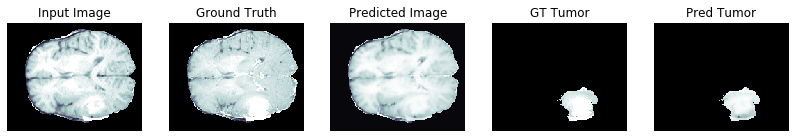

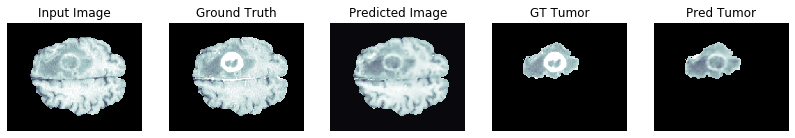

PSNR on validation set: 24.7761 ± 3.7530
MSE on validation set: 0.0044 ± 0.0036
SSIM on validation set: 0.8300 ± 0.0872

PSNR wrt tumor area on validation set: 35.4884 ± 11.6160
MSE wrt tumor area on validation set: 0.0009 ± 0.0011
SSIM wrt tumor area on validation set: 0.9762 ± 0.0230

Generator loss on validation set: 1.9352 ± 0.8198
Discriminator loss on validation set: 1.5845 ± 0.1059


(<tf.Tensor: shape=(), dtype=float32, numpy=24.776085>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0044276603>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.8300424>,
 <tf.Tensor: shape=(), dtype=float32, numpy=35.488365>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.00091472996>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.97615814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.9351636>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.584452>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

In [0]:
generator.save('drive/My Drive/MRI-generation/gen_T1_finalModel.h5')

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 